<a href="https://www.kaggle.com/code/klyushnik/episode-14?scriptVersionId=168412676" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
import warnings
warnings.filterwarnings('ignore')
from IPython.display import Image
%matplotlib inline
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.isotonic import IsotonicRegression
import random
import os
from copy import deepcopy
from functools import partial
from itertools import combinations

# Import sklearn classes for model selection, cross validation, and performance evaluation
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import StratifiedKFold, KFold, RepeatedKFold
from sklearn.metrics import roc_auc_score, accuracy_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import seaborn as sns
from category_encoders import OneHotEncoder, OrdinalEncoder, CountEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import VotingRegressor

import optuna

import xgboost as xgb
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from catboost import CatBoost, CatBoostRegressor, CatBoostClassifier
from catboost import Pool
from h2o.automl import H2OAutoML

# Suppress warnings
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/tmp/ipykernel_20/3976548102.py:7: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling
h2o:1: DeprecationWarning: Your Python version is 3.10.10. The support for this version will be removed in H2O 3.42.0.1.


/kaggle/input/wild-blueberry-yield-prediction-dataset/WildBlueberryPollinationSimulationData.csv
/kaggle/input/playground-series-s3e14/sample_submission.csv
/kaggle/input/playground-series-s3e14/train.csv
/kaggle/input/playground-series-s3e14/test.csv


# Load data

In [2]:
train = pd.read_csv(r'../input/playground-series-s3e14/train.csv')
test = pd.read_csv(r'../input/playground-series-s3e14/test.csv')
orig_train = pd.read_csv(r'../input/wild-blueberry-yield-prediction-dataset/WildBlueberryPollinationSimulationData.csv')

train.drop('id', axis = 1, inplace = True)
test = test.drop('id', axis = 1)
orig_train.drop('Row#', axis = 1, inplace = True)

In [3]:
train = pd.concat([train, orig_train], ignore_index=True)

# Information about data

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16066 entries, 0 to 16065
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   clonesize             16066 non-null  float64
 1   honeybee              16066 non-null  float64
 2   bumbles               16066 non-null  float64
 3   andrena               16066 non-null  float64
 4   osmia                 16066 non-null  float64
 5   MaxOfUpperTRange      16066 non-null  float64
 6   MinOfUpperTRange      16066 non-null  float64
 7   AverageOfUpperTRange  16066 non-null  float64
 8   MaxOfLowerTRange      16066 non-null  float64
 9   MinOfLowerTRange      16066 non-null  float64
 10  AverageOfLowerTRange  16066 non-null  float64
 11  RainingDays           16066 non-null  float64
 12  AverageRainingDays    16066 non-null  float64
 13  fruitset              16066 non-null  float64
 14  fruitmass             16066 non-null  float64
 15  seeds              

In [5]:
train.describe()

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
count,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000,16066.000000
mean,19.659374,0.390660,0.286556,0.491522,0.590890,82.175072,49.674599,68.659486,59.233400,28.661988,48.570659,18.643862,0.323974,0.502711,0.446525,36.162894,6024.596965
std,6.618134,0.413259,0.060249,0.148849,0.141209,9.148725,5.548630,7.643286,6.612254,3.195960,5.391670,11.680433,0.164266,0.074639,0.037200,4.048407,1337.985859
min,10.000000,0.000000,0.000000,0.000000,0.000000,69.700000,39.000000,58.200000,50.200000,24.300000,41.200000,1.000000,0.060000,0.192732,0.311921,22.079199,1637.704022
25%,12.500000,0.250000,0.250000,0.380000,0.500000,77.400000,46.800000,64.700000,55.800000,27.000000,45.800000,16.000000,0.260000,0.457833,0.418867,33.232449,5128.163510
50%,25.000000,0.500000,0.250000,0.500000,0.630000,86.000000,52.000000,71.900000,62.000000,30.000000,50.800000,16.000000,0.260000,0.506686,0.446570,36.047770,6117.475900
75%,25.000000,0.500000,0.380000,0.630000,0.750000,86.000000,52.000000,71.900000,62.000000,30.000000,50.800000,24.000000,0.390000,0.560709,0.474777,39.158238,7019.694380
max,40.000000,18.430000,0.585000,0.750000,0.750000,94.600000,57.200000,79.000000,68.200000,33.000000,55.900000,34.000000,0.560000,0.652144,0.535660,46.585105,8969.401842


In [6]:
print(train.isnull().sum())

clonesize               0
honeybee                0
bumbles                 0
andrena                 0
osmia                   0
MaxOfUpperTRange        0
MinOfUpperTRange        0
AverageOfUpperTRange    0
MaxOfLowerTRange        0
MinOfLowerTRange        0
AverageOfLowerTRange    0
RainingDays             0
AverageRainingDays      0
fruitset                0
fruitmass               0
seeds                   0
yield                   0
dtype: int64


# ProfileReport

In [7]:
pandas_profiling.ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Plot links

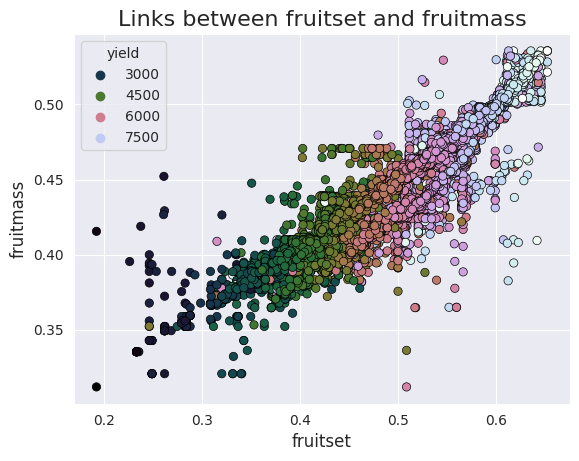

In [8]:
sns.set_style('darkgrid')
plt.title('Links between fruitset and fruitmass',size=16)
plt.xlabel('fruitset',size=12)
plt.ylabel('fruitmass',size=12)
sns.scatterplot(x='fruitset', y='fruitmass', data=train, hue='yield', edgecolor='black', palette='cubehelix')
plt.show()

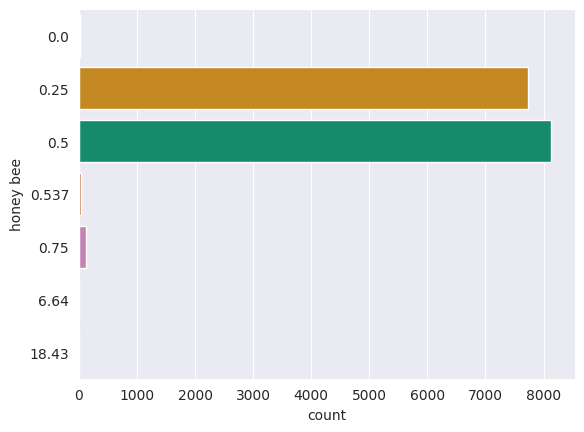

In [9]:
sns.set_style('darkgrid')
sns.countplot(y='honeybee',data=train,palette='colorblind')
plt.xlabel('count')
plt.ylabel('honey bee')
plt.show()

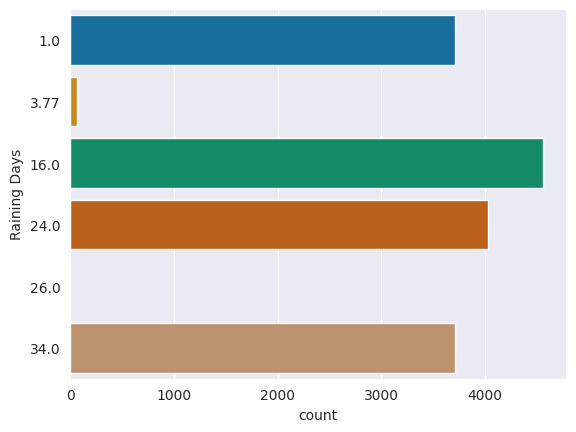

In [10]:
sns.set_style('darkgrid')
sns.countplot(y='RainingDays',data=train,palette='colorblind')
plt.xlabel('count')
plt.ylabel('Raining Days')
plt.show()

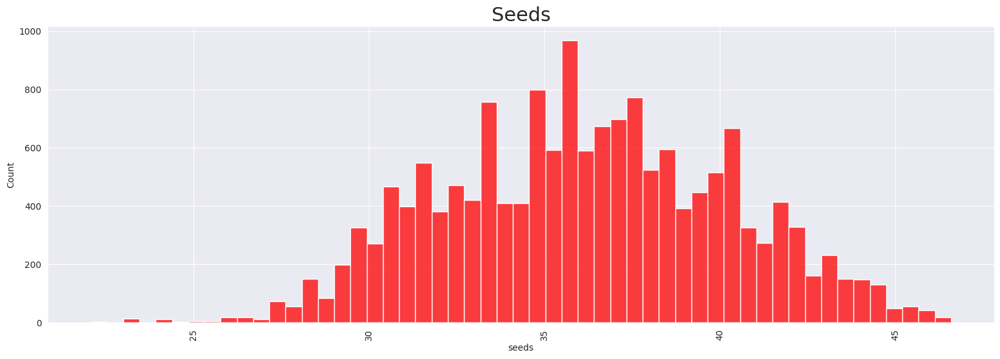

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(19, 6))
sns.histplot(x='seeds', data=train, palette='Paired', ax=ax, color = 'red')
ax.tick_params(axis='x', rotation=90)
plt.title("Seeds", fontsize=22)
plt.show()

# Outlier

In [12]:
print('Columns:', train.columns)

Columns: Index(['clonesize', 'honeybee', 'bumbles', 'andrena', 'osmia',
       'MaxOfUpperTRange', 'MinOfUpperTRange', 'AverageOfUpperTRange',
       'MaxOfLowerTRange', 'MinOfLowerTRange', 'AverageOfLowerTRange',
       'RainingDays', 'AverageRainingDays', 'fruitset', 'fruitmass', 'seeds',
       'yield'],
      dtype='object')


In [13]:
def outlier_removal(data , i):
    q1 = np.quantile(data[i] ,0.25)
    q3 = np.quantile(data[i] , 0.75)
    iqr = q3-q1
    lower_tail = q1 - 1.5*iqr
    upper_tail = q3 + 1.5*iqr
    data.drop(data[data[i]> upper_tail].index , inplace = True)
    data.drop(data[data[i]< lower_tail].index ,inplace =True)
    
outlier_list = ['clonesize', 'honeybee', 'bumbles', 'andrena', 'osmia',
       'MaxOfUpperTRange', 'MinOfUpperTRange', 'AverageOfUpperTRange',
       'MaxOfLowerTRange', 'MinOfLowerTRange', 'AverageOfLowerTRange',
       'RainingDays', 'AverageRainingDays', 'fruitset', 'fruitmass', 'seeds']
#for  i in outlier_list:
    #outlier_removal(train ,i)

# Data marking

In [14]:
X = train.drop(columns = ['yield'],  axis =1)
y = train['yield']
X_total = test

# Aggregate Featrues

In [15]:
class AggFeatureExtractor(BaseEstimator, TransformerMixin):
    
    def __init__(self, group_col, agg_col, agg_func):
        self.group_col = group_col
        self.group_col_name = ''
        for col in group_col:
            self.group_col_name += col
        self.agg_col = agg_col
        self.agg_func = agg_func
        self.agg_df = None
        self.medians = None
        
    def fit(self, X, y=None):
        group_col = self.group_col
        agg_col = self.agg_col
        agg_func = self.agg_func
        
        self.agg_df = X.groupby(group_col)[agg_col].agg(agg_func)
        self.agg_df.columns = [f'{self.group_col_name}_{agg}_{_agg_col}' for _agg_col in agg_col for agg in agg_func]
        self.medians = X[agg_col].median()
        
        return self
    
    def transform(self, X):
        group_col = self.group_col
        agg_col = self.agg_col
        agg_func = self.agg_func
        agg_df = self.agg_df
        medians = self.medians
        
        X_merged = pd.merge(X, agg_df, left_on=group_col, right_index=True, how='left')
        X_merged.fillna(medians, inplace=True)
        X_agg = X_merged.loc[:, [f'{self.group_col_name}_{agg}_{_agg_col}' for _agg_col in agg_col for agg in agg_func]]
        
        return X_agg
    
    def fit_transform(self, X, y=None):
        self.fit(X, y)
        X_agg = self.transform(X)
        return X_agg


In [16]:
class Preprocessor:
    def __init__(self, agg_col, agg_func, group_cols):
        self.agg_col = agg_col
        self.agg_func = agg_func
        self.group_cols = group_cols
        
    def preprocess(self, X, X_total):        
        agg_train, agg_test = [], []
        for group_col in self.group_cols:
            agg_extractor = AggFeatureExtractor(group_col=group_col, agg_col=self.agg_col, agg_func=self.agg_func)
            agg_extractor.fit(pd.concat([X, X_total], axis=0))
            agg_train.append(agg_extractor.transform(X))
            agg_test.append(agg_extractor.transform(X_total))
        X = pd.concat([X] + agg_train, axis=1)
        X_total = pd.concat([X_total] + agg_test, axis=1)
        
        X = X.fillna(0)
        X_total = X_total.fillna(0)
                
        return X, X_total   

In [17]:
X.columns

Index(['clonesize', 'honeybee', 'bumbles', 'andrena', 'osmia',
       'MaxOfUpperTRange', 'MinOfUpperTRange', 'AverageOfUpperTRange',
       'MaxOfLowerTRange', 'MinOfLowerTRange', 'AverageOfLowerTRange',
       'RainingDays', 'AverageRainingDays', 'fruitset', 'fruitmass', 'seeds'],
      dtype='object')

In [18]:
agg_col = [
           'clonesize', 'honeybee', 'bumbles', 'andrena', 'osmia',
           'MaxOfUpperTRange', 'MinOfUpperTRange', 'AverageOfUpperTRange',
           'MaxOfLowerTRange', 'MinOfLowerTRange', 'AverageOfLowerTRange',
           'RainingDays', 'AverageRainingDays', 'fruitset', 'fruitmass', 'seeds'
          ]

agg_func = ['mean', 'std', 'median']
group_cols = [['fruitset'], ['fruitmass'], ['seeds'], 
              ['fruitset', 'fruitmass'], ['fruitset', 'seeds'], 
              ['fruitmass', 'seeds'], 
              ['fruitset', 'fruitmass', 'seeds']]

pp = Preprocessor(agg_col, agg_func, group_cols)
X, X_total = pp.preprocess(X, X_total)

print(f"X shape :{X.shape} , y shape :{y.shape}")
print(f"X_test shape :{X_total.shape}")

X shape :(16066, 352) , y shape :(16066,)
X_test shape :(10194, 352)


# Split data

In [19]:
class Split:
    def __init__(self, test_size=0.2, kfold=True, n_splits=3):
        self.test_size = test_size
        self.kfold = kfold
        self.n_splits = n_splits

    def split_data(self, X, y, random_state_list):
        if self.kfold:
            for random_state in random_state_list:
                kf = KFold(n_splits=self.n_splits, random_state=random_state, shuffle=True)
                for train_index, val_index in kf.split(X, y):
                    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
                    y_train, y_val = y.iloc[train_index], y.iloc[val_index]
                    yield X_train, X_val, y_train, y_val
        else:
            for random_state in random_state_list:
                X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=self.test_size, random_state=random_state)
                yield X_train, X_val, y_train, y_val
kfold = True
n_splits = 9
random_state = 7777
random_state_list = [32, 52, 72] # split_data

splitter = Split(kfold=kfold, n_splits=n_splits)

# Parametrs

In [20]:
n_estimators = 2000

xgb_params = {
    'n_estimators': n_estimators,
    'max_depth': 6,
    'learning_rate': 0.0116,
    'colsample_bytree': 1,
    'subsample': 0.6085,
    'min_child_weight': 9,
    'reg_lambda': 4.879e-07,
    'max_bin': 431,
    'n_jobs': -1,
    'eval_metric': 'mae',
    'objective': "reg:squarederror",
    'verbosity': 0}

lgb_params = {
    'n_estimators': n_estimators,
    "num_leaves": 16,
    'learning_rate': 0.05,
    'subsample': 0.60,
    'colsample_bytree': 1,
    'reg_alpha': 0.25,
    'reg_lambda': 5e-07,
    'objective': 'regression_l1',
    'metric': 'mean_absolute_error',
    'boosting_type': 'gbdt'
}

cb_params = {
    'n_estimators': n_estimators,
    'depth': 8,
    'learning_rate': 0.01,
    'l2_leaf_reg': 0.7,
    'random_strength': 0.2,
    'max_bin': 200,
    'od_wait': 65,
    'bootstrap_type': 'Bayesian',
    'eval_metric': 'MAE',
    'loss_function': 'MAE',
    'verbose':0}

xgb_params0 = {'n_estimators': n_estimators, 'verbosity': 0}
lgb_params0 = {'n_estimators': n_estimators}
cb_params0 = {'n_estimators': n_estimators,'verbose':0}

# Train regressor

In [21]:
def train_regressor(regressor, X_train, y_train, X_val, y_val, regressor_params, early_stopping_rounds=100, random_state=42):
    regressor = regressor(**regressor_params, random_state=random_state)
    eval_set = [(X_val, y_val)]
    regressor.fit(X_train, y_train, early_stopping_rounds=early_stopping_rounds, eval_set=eval_set, verbose=False)
    val_preds = regressor.predict(X_val)
    mae = mean_absolute_error(y_val, val_preds)
    return regressor, mae

In [22]:
xgb_models, lgb_models, cb_models = [], [], []
xgb_scores, lgb_scores, cb_scores = [], [], []
for X_train_, X_val, y_train_, y_val in splitter.split_data(X, y, random_state_list=random_state_list):
    xgb_model, xgb_mae = train_regressor(xgb.XGBRegressor, X_train_, y_train_, X_val, y_val, xgb_params)
    lgb_model, lgb_mae = train_regressor(lgb.LGBMRegressor, X_train_, y_train_, X_val, y_val, lgb_params)
    cb_model, cb_mae = train_regressor(CatBoostRegressor, X_train_, y_train_, X_val, y_val, cb_params)
    xgb_models.append(deepcopy(xgb_model)), lgb_models.append(deepcopy(lgb_model)), cb_models.append(deepcopy(cb_model))
    xgb_scores.append(xgb_mae), lgb_scores.append(lgb_mae), cb_scores.append(cb_mae)

# OptunaWeights

In [23]:
class OptunaWeights:
    def __init__(self, random_state):
        self.study = None
        self.weights = None
        self.random_state = random_state

    def _objective(self, trial, y_true, y_preds):
        # Define the weights for the predictions from each model
        weights = [trial.suggest_float(f"weight{n}", 0, 1) for n in range(len(y_preds))]

        weighted_pred = np.average(np.array(y_preds).T, axis=1, weights=weights)

        score = mean_absolute_error(y_true, weighted_pred)
        return score

    def fit(self, y_true, y_preds, n_trials=300):
        optuna.logging.set_verbosity(optuna.logging.ERROR)
        sampler = optuna.samplers.CmaEsSampler(seed=self.random_state)
        self.study = optuna.create_study(sampler=sampler, study_name="OptunaWeights", direction='minimize')
        objective_partial = partial(self._objective, y_true=y_true, y_preds=y_preds)
        self.study.optimize(objective_partial, n_trials=n_trials)
        self.weights = [self.study.best_params[f"weight{n}"] for n in range(len(y_preds))]

    def predict(self, y_preds):
        assert self.weights is not None, 'OptunaWeights error, must be fitted before predict'
        weighted_pred = np.average(np.array(y_preds).T, axis=1, weights=self.weights)
        return weighted_pred

    def fit_predict(self, y_true, y_preds, n_trials=300):
        self.fit(y_true, y_preds, n_trials=n_trials)
        return self.predict(y_preds)
    
    def weights(self):
        return self.weights

In [24]:
models = np.array([xgb_models, lgb_models, cb_models]).T.tolist()
names = ['XGBoost', 'LightGBM', 'CatBoost']

# Initialize variables
test_predss = np.zeros(X_total.shape[0])
ensemble_score = []
weights = []

# Loop through the folds
i = 0
for _model, (X_train_, X_val, y_train_, y_val) in zip(models, splitter.split_data(X, y, random_state_list=random_state_list)):
    n = i % n_splits
    m = i // n_splits
    val_preds, test_preds, zero_test_preds = [], [], []
    for model in _model:
        oof_pred = model.predict(X_val.values)
        test_pred = model.predict(X_total.values)
        val_preds.append(oof_pred)
        test_preds.append(test_pred)
        
    # Use Optuna to find the best ensemble weights
    optweights = OptunaWeights(random_state=random_state)
    val_pred = optweights.fit_predict(y_val.values, val_preds)
    score = mean_absolute_error(y_val, val_pred)
    print(f'[FOLD-{n} SEED-{random_state_list[m]}] MAE score {score:.5f}')
    ensemble_score.append(score)
    weights.append(optweights.weights)
    
    # Predict on the test set using the optimized ensemble weights
    test_predss += optweights.predict(test_preds) / (n_splits * len(random_state_list))
    i += 1
    
# Calculate the mean AUC score of the ensemble
mean_score = np.mean(ensemble_score)
std_score = np.std(ensemble_score)
print(f'Ensemble MAE score {mean_score:.5f} ± {std_score:.5f}')

# Print the mean and standard deviation of the ensemble weights for each model
print('--- Model Weights ---')
mean_weights = np.mean(weights, axis=0)
std_weights = np.std(weights, axis=0)
for name, mean_weight, std_weight in zip(names, mean_weights, std_weights):
    print(f'{name} {mean_weight:.5f} ± {std_weight:.5f}')

[FOLD-0 SEED-32] MAE score 325.41150
[FOLD-1 SEED-32] MAE score 328.24944
[FOLD-2 SEED-32] MAE score 358.15023
[FOLD-3 SEED-32] MAE score 328.16579
[FOLD-4 SEED-32] MAE score 328.97987
[FOLD-5 SEED-32] MAE score 324.12787
[FOLD-6 SEED-32] MAE score 325.56219
[FOLD-7 SEED-32] MAE score 331.41263
[FOLD-8 SEED-32] MAE score 322.73230
[FOLD-0 SEED-52] MAE score 324.10766
[FOLD-1 SEED-52] MAE score 318.54279
[FOLD-2 SEED-52] MAE score 340.01738
[FOLD-3 SEED-52] MAE score 339.35935
[FOLD-4 SEED-52] MAE score 331.25433
[FOLD-5 SEED-52] MAE score 343.01478
[FOLD-6 SEED-52] MAE score 315.90759
[FOLD-7 SEED-52] MAE score 327.05323
[FOLD-8 SEED-52] MAE score 324.73487
[FOLD-0 SEED-72] MAE score 330.98847
[FOLD-1 SEED-72] MAE score 333.43275
[FOLD-2 SEED-72] MAE score 317.32076
[FOLD-3 SEED-72] MAE score 326.69299
[FOLD-4 SEED-72] MAE score 335.89950
[FOLD-5 SEED-72] MAE score 329.24959
[FOLD-6 SEED-72] MAE score 329.22480
[FOLD-7 SEED-72] MAE score 341.05150
[FOLD-8 SEED-72] MAE score 325.18507
E

# H2O Auto ML 

In [25]:
startup  = '/home/h2o/bin/aquarium_startup'
shutdown = '/home/h2o/bin/aquarium_stop'

if os.path.exists(startup):
    os.system(startup)
    local_url = 'http://localhost:54321/h2o'
    aquarium = True
else:
    local_url = 'http://localhost:54321'
    aquarium = False
    
import os
import h2o

In [26]:
h2o.init(url=local_url)

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /opt/conda/lib/python3.10/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpu6r2xmbu
  JVM stdout: /tmp/tmpu6r2xmbu/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpu6r2xmbu/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.
Please download and install the latest version from: https://h2o-release.s3.amazonaws.com/h2o/latest_stable.html


H2O_cluster_uptime:,04 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,11 months and 19 days
H2O_cluster_name:,H2O_from_python_unknownUser_z7vhsb
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,7.234 Gb
H2O_cluster_total_cores:,1
H2O_cluster_allowed_cores:,1
H2O_cluster_status:,"locked, healthy"


In [27]:
X_y_train_h = h2o.H2OFrame(
    
    pd.concat([X, y], axis =1)
)

X_y_train_h.describe()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


Rows:16066
Cols:353

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,fruitset_mean_clonesize,fruitset_std_clonesize,fruitset_median_clonesize,fruitset_mean_honeybee,fruitset_std_honeybee,fruitset_median_honeybee,fruitset_mean_bumbles,fruitset_std_bumbles,fruitset_median_bumbles,fruitset_mean_andrena,fruitset_std_andrena,fruitset_median_andrena,fruitset_mean_osmia,fruitset_std_osmia,fruitset_median_osmia,fruitset_mean_MaxOfUpperTRange,fruitset_std_MaxOfUpperTRange,fruitset_median_MaxOfUpperTRange,fruitset_mean_MinOfUpperTRange,fruitset_std_MinOfUpperTRange,fruitset_median_MinOfUpperTRange,fruitset_mean_AverageOfUpperTRange,fruitset_std_AverageOfUpperTRange,fruitset_median_AverageOfUpperTRange,fruitset_mean_MaxOfLowerTRange,fruitset_std_MaxOfLowerTRange,fruitset_median_MaxOfLowerTRange,fruitset_mean_MinOfLowerTRange,fruitset_std_MinOfLowerTRange,fruitset_median_MinOfLowerTRange,fruitset_mean_AverageOfLowerTRange,fruitset_std_AverageOfLowerTRange,fruitset_median_AverageOfLowerTRange,fruitset_mean_RainingDays,fruitset_std_RainingDays,fruitset_median_RainingDays,fruitset_mean_AverageRainingDays,fruitset_std_AverageRainingDays,fruitset_median_AverageRainingDays,fruitset_mean_fruitset,fruitset_std_fruitset,fruitset_median_fruitset,fruitset_mean_fruitmass,fruitset_std_fruitmass,fruitset_median_fruitmass,fruitset_mean_seeds,fruitset_std_seeds,fruitset_median_seeds,fruitmass_mean_clonesize,fruitmass_std_clonesize,fruitmass_median_clonesize,fruitmass_mean_honeybee,fruitmass_std_honeybee,fruitmass_median_honeybee,fruitmass_mean_bumbles,fruitmass_std_bumbles,fruitmass_median_bumbles,fruitmass_mean_andrena,fruitmass_std_andrena,fruitmass_median_andrena,fruitmass_mean_osmia,fruitmass_std_osmia,fruitmass_median_osmia,fruitmass_mean_MaxOfUpperTRange,fruitmass_std_MaxOfUpperTRange,fruitmass_median_MaxOfUpperTRange,fruitmass_mean_MinOfUpperTRange,fruitmass_std_MinOfUpperTRange,fruitmass_median_MinOfUpperTRange,fruitmass_mean_AverageOfUpperTRange,fruitmass_std_AverageOfUpperTRange,fruitmass_median_AverageOfUpperTRange,fruitmass_mean_MaxOfLowerTRange,fruitmass_std_MaxOfLowerTRange,fruitmass_median_MaxOfLowerTRange,fruitmass_mean_MinOfLowerTRange,fruitmass_std_MinOfLowerTRange,fruitmass_median_MinOfLowerTRange,fruitmass_mean_AverageOfLowerTRange,fruitmass_std_AverageOfLowerTRange,fruitmass_median_AverageOfLowerTRange,fruitmass_mean_RainingDays,fruitmass_std_RainingDays,fruitmass_median_RainingDays,fruitmass_mean_AverageRainingDays,fruitmass_std_AverageRainingDays,fruitmass_median_AverageRainingDays,fruitmass_mean_fruitset,fruitmass_std_fruitset,fruitmass_median_fruitset,fruitmass_mean_fruitmass,fruitmass_std_fruitmass,fruitmass_median_fruitmass,fruitmass_mean_seeds,fruitmass_std_seeds,fruitmass_median_seeds,seeds_mean_clonesize,seeds_std_clonesize,seeds_median_clonesize,seeds_mean_honeybee,seeds_std_honeybee,seeds_median_honeybee,seeds_mean_bumbles,seeds_std_bumbles,seeds_median_bumbles,seeds_mean_andrena,seeds_std_andrena,seeds_median_andrena,seeds_mean_osmia,seeds_std_osmia,seeds_median_osmia,seeds_mean_MaxOfUpperTRange,seeds_std_MaxOfUpperTRange,seeds_median_MaxOfUpperTRange,seeds_mean_MinOfUpperTRange,seeds_std_MinOfUpperTRange,seeds_median_MinOfUpperTRange,seeds_mean_AverageOfUpperTRange,seeds_std_AverageOfUpperTRange,seeds_median_AverageOfUpperTRange,seeds_mean_MaxOfLowerTRange,seeds_std_MaxOfLowerTRange,seeds_median_MaxOfLowerTRange,seeds_mean_MinOfLowerTRange,seeds_std_MinOfLowerTRange,seeds_median_MinOfLowerTRange,seeds_mean_AverageOfLowerTRange,seeds_std_AverageOfLowerTRange,seeds_median_AverageOfLowerTRange,seeds_mean_RainingDays,seeds_std_RainingDays,seeds_median_RainingDays,seeds_mean_AverageRainingDays,seeds_std_AverageRainingDays,seeds_median_AverageRainingDays,seeds_mean_fruitset,seeds_std_fruitset,seeds_median_fruitset,seeds_mean_fruitmass,seeds_std_fruitmass,seeds_median_fruitmass,seeds_mean_se

In [28]:
train_, test_ = X_y_train_h.split_frame([0.8], seed=623)

In [29]:
print("train:%d test:%d" % (train_.nrows, test_.nrows))

train:12915 test:3151


In [30]:
y_reg = "yield"

x_reg = train_.names

In [31]:
aml = H2OAutoML(max_runtime_secs=900, 
                max_runtime_secs_per_model=30, 
                seed=623, 
                project_name='regression', 
                stopping_metric="MAE", 
                sort_metric="MAE")

%time 
aml.train(x=x_reg, y=y_reg, training_frame=train_)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.11 µs
AutoML progress: |
14:50:19.774: _train param, Dropping bad and constant columns: [fruitsetfruitmass_std_fruitmass, fruitmass_std_fruitmass, seeds_std_seeds, fruitsetfruitmassseeds_std_seeds, fruitset_std_fruitset, fruitsetseeds_std_seeds, fruitmassseeds_std_seeds, fruitsetfruitmassseeds_std_fruitmass, fruitsetfruitmass_std_fruitset, fruitsetfruitmassseeds_std_fruitset, fruitmassseeds_std_fruitmass, fruitsetseeds_std_fruitset]

███
14:50:40.998: _train param, Dropping bad and constant columns: [fruitsetfruitmass_std_fruitmass, fruitmass_std_fruitmass, seeds_std_seeds, fruitsetfruitmassseeds_std_seeds, fruitset_std_fruitset, fruitsetseeds_std_seeds, fruitmassseeds_std_seeds, fruitsetfruitmassseeds_std_fruitmass, fruitsetfruitmass_std_fruitset, fruitsetfruitmassseeds_std_fruitset, fruitmassseeds_std_fruitmass, fruitsetseeds_std_fruitset]


14:50:47.36: _train param, Dropping bad and constant columns: [fruitsetfruitmass_std_f

,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,60.0,60.0,26124.0,5.0,5.0,5.0,19.0,32.0,29.966667
,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
,2024-03-23 15:01:02,1 min 23.709 sec,0.0,1344.1020713,1094.9503456,1806610.3780038,1376.1842205,1145.8747111,1893883.0087016
,2024-03-23 15:01:03,1 min 24.303 sec,5.0,908.6919287,728.0537499,825721.0213239,942.7628415,765.9254200,888801.7752323
,2024-03-23 15:01:04,1 min 24.892 sec,10.0,687.2592115,529.9061400,472325.2238229,732.1639566,558.9735088,536064.0593433
,2024-03-23 15:01:04,1 min 25.443 sec,15.0,583.0861821,423.8138192,339989.4957847,643.1692280,448.9765313,413666.6558231
,2024-03-23 15:01:05,1 min 26.249 sec,20.0,535.0308709,369.6838020,286258.0328284,609.2096085,393.8552584,371136.3470716
,2024-03-23 15:01:06,1 min 26.801 sec,25.0,512.1451596,342.4420112,262292.6645218,597.0430301,368.0797486,356460.3797819
,2024-03-23 15:01:06,1 min 27.352 sec,30.0,497.0668768,327.5401006,247075.4799681,594.0630683,356.1987801,352910.9291145
,2024-03-23 15:01:07,1 min 27.885 sec,35.0,486.9792030,319.0631191,237148.7441489,591.7909114,350.3594968,350216.4828518


In [32]:
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,mae,rmse,mse,rmsle,mean_residual_deviance
GBM_grid_1_AutoML_1_20240323_145017_model_6,347.501,589.507,347518,0.102292,347518
StackedEnsemble_AllModels_3_AutoML_1_20240323_145017,349.97,586.967,344531,0.101991,344531
StackedEnsemble_AllModels_4_AutoML_1_20240323_145017,349.97,586.967,344531,0.101991,344531
StackedEnsemble_BestOfFamily_2_AutoML_1_20240323_145017,350.926,585.169,342423,0.101731,342423
GBM_grid_1_AutoML_1_20240323_145017_model_1,351.089,590.73,348961,0.102811,348961
StackedEnsemble_BestOfFamily_4_AutoML_1_20240323_145017,351.162,586.747,344272,0.101646,344272
GBM_grid_1_AutoML_1_20240323_145017_model_2,351.354,593.032,351687,0.10341,351687
StackedEnsemble_AllModels_2_AutoML_1_20240323_145017,351.598,587.525,345186,0.101994,345186
StackedEnsemble_AllModels_1_AutoML_1_20240323_145017,351.637,588.047,345800,0.102199,345800
GBM_5_AutoML_1_20240323_145017,352.588,591.438,349799,0.103251,349799


In [33]:
aml.leader

,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,60.0,60.0,26124.0,5.0,5.0,5.0,19.0,32.0,29.966667
,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
,2024-03-23 15:01:02,1 min 23.709 sec,0.0,1344.1020713,1094.9503456,1806610.3780038,1376.1842205,1145.8747111,1893883.0087016
,2024-03-23 15:01:03,1 min 24.303 sec,5.0,908.6919287,728.0537499,825721.0213239,942.7628415,765.9254200,888801.7752323
,2024-03-23 15:01:04,1 min 24.892 sec,10.0,687.2592115,529.9061400,472325.2238229,732.1639566,558.9735088,536064.0593433
,2024-03-23 15:01:04,1 min 25.443 sec,15.0,583.0861821,423.8138192,339989.4957847,643.1692280,448.9765313,413666.6558231
,2024-03-23 15:01:05,1 min 26.249 sec,20.0,535.0308709,369.6838020,286258.0328284,609.2096085,393.8552584,371136.3470716
,2024-03-23 15:01:06,1 min 26.801 sec,25.0,512.1451596,342.4420112,262292.6645218,597.0430301,368.0797486,356460.3797819
,2024-03-23 15:01:06,1 min 27.352 sec,30.0,497.0668768,327.5401006,247075.4799681,594.0630683,356.1987801,352910.9291145
,2024-03-23 15:01:07,1 min 27.885 sec,35.0,486.9792030,319.0631191,237148.7441489,591.7909114,350.3594968,350216.4828518


In [34]:
preds = aml.predict(test_)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [35]:
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])
# Get the "All Models" Stacked Ensemble model
se = h2o.get_model([mid for mid in model_ids if "StackedEnsemble_AllModels" in mid][0])
# Get the Stacked Ensemble metalearner model
metalearner = h2o.get_model(se.metalearner()['name'])

/opt/conda/lib/python3.10/site-packages/h2o/estimators/stackedensemble.py:926: H2ODeprecationWarning: The usage of stacked_ensemble.metalearner()['name'] will be deprecated. Metalearner now returns the metalearner object. If you need to get the 'name' please use stacked_ensemble.metalearner().model_id
  warnings.warn(


In [36]:
metalearner

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: metalearner_AUTO_StackedEnsemble_AllModels_3_AutoML_1_20240323_145017


GLM Model: summary
    family    link      regularization            lambda_search                                                                  number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ------------------------  -----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------------------------------------------------------------
    gaussian  identity  Lasso (lambda = 6698.3 )  nlambda = 100, lambda.max = 3412200.0, lambda.min = 6698.3, lambda.1se = -1.0  52                            18                             68                      levelone_training_StackedEnsemble_AllModels_3_AutoML_1_20240323_145017

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 300351.7531905967
RMSE: 548.0435686974135
MAE: 342.2023496532846
RMSLE: 0.09921031743790563
Mean Residual Deviance: 300351.7531905967
R^2: 0.8291158373869995
Null degrees of freedom: 2601
Residual degrees of freedom: 2583
Null deviance: 4573362737.960995
Residual deviance: 781515261.8019326
AIC: 40242.42644724372

ModelMetricsRegressionGLM: glm
** Reported on validation data. **

MSE: 344530.58822141273
RMSE: 586.9672803669832
MAE: 349.97036918659023
RMSLE: 0.10199084285734906
Mean Residual Deviance: 344530.58822141273
R^2: 0.8180780333370865
Null degrees of freedom: 1304
Residual degrees of freedom: 1286
Null deviance: 2471545225.8087435
Residual deviance: 449612417.6289436
AIC: 20382.09886483575

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train      deviance_test       alpha    iterations    training_rmse      training_deviance    training_mae       training_r2         validation_rmse    validation_deviance    validation_mae      validation_r2
---  -------------------  ----------  -----------  --------  ------------  ------------------  ------------------  -------  ------------  -----------------  -------------------  -----------------  ------------------  -----------------  ---------------------  ------------------  ------------------
     2024-03-23 15:04:35  0.000 sec   1            .34E7     1             1757633.633433114   1893904.3895444556  0.5
     2024-03-23 15:04:35  0.004 sec   2            .31E7     3             1607911.241718524   1736937.1329562417  0.5
     2024-03-23 15:04:35  0.008 sec   3            .28E7     3             1445585.6116159777  1566316.953412522   0.5
     2024-03-23 15:04:36  0.012 sec   4            .26E7     4             1290212.6800797659  1402682.9599395897  0.5
     2024-03-23 15:04:36  0.016 sec   5            .24E7     4             1152907.6854987354  1257898.0890351313  0.5
     2024-03-23 15:04:36  0.021 sec   6            .21E7     4             1033341.056513963   1131664.7628987671  0.5
     2024-03-23 15:04:36  0.030 sec   7            .2E7      8             925088.5412898023   1017301.0938059649  0.5
     2024-03-23 15:04:36  0.035 sec   8            .18E7     17            823610.3889451727   909652.9209592695   0.5
     2024-03-23 15:04:36  0.040 sec   9            .16E7     23            737764.1407640825   818298.1547926791   0.5
     2024-03-23 15:04:36  0.045 sec   10           .15E7     28            665497.7214569397   741109.56900361     0.5
---  ---                  ---         ---          ---       ---           ---                 ---                 ---      ---           ---                ---                  ---                ---                 ---                ---                    ---                 ---
     2024-03-23 15:04:36  0.492 sec   91           .79E3     17            298878.3741499588   345549.0713830875   0.5
     2024-03-23 15:04:36  0.496 se

# test predict

In [37]:
pred = aml.leader.predict(test_)
pred = pred.cbind(test_['yield'])

pred.head()

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


predict,yield
6947.55,6986.81
6132.83,6687.26
6532,6060.64
7455.78,7738.88
8356.07,8408.38
7015.49,6595.46
7560.42,8263.29
6745.67,6482.71
4990.52,3373.44
4145.36,4218.33


# total predict

In [38]:
X_y_test_h = h2o.H2OFrame(X_total)
predict_ = aml.leader.predict(X_y_test_h)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [39]:
predict_h2o = h2o.as_list(predict_)

In [40]:
predict_h2o

,predict
0,4272.723290
1,6151.570647
2,7178.018260
3,4695.939905
4,3778.869387
...,...
10189,5526.494177
10190,5661.666791
10191,6558.296344
10192,4440.050232


In [41]:
h2o.cluster().shutdown()

H2O session _sid_b0eb closed.


# Predict

In [42]:
sub = pd.read_csv('/kaggle/input/playground-series-s3e14/sample_submission.csv')
sub['yield'] = test_predss #predict_h2o.predict*
sub

,id,yield
0,15289,4205.954851
1,15290,5908.502705
2,15291,7199.191574
3,15292,4524.280890
4,15293,3826.660109
...,...,...
10189,25478,5413.961029
10190,25479,5667.860897
10191,25480,6583.690958
10192,25481,4352.539051


In [43]:
sub.to_csv('submission.csv', index=False)